In [1]:
import fraud_utils
import pandas as pd
import numpy as np
from fraud_utils import *
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import shap
import matplotlib.pyplot as plt 
import lime
import joblib
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.inspection import PartialDependenceDisplay
from lime.lime_tabular import LimeTabularExplainer
import dice_ml
from dice_ml.utils import helpers  
from ml_explainability import *
from joblib import load

In [2]:
file_path = 'fraud_data.csv'
df = load_fraud_data(file_path)
print(df.shape, df.columns.tolist())

(200000, 9) ['step', 'type', 'amount', 'oldbalanceOrg', 'isFraud', 'bal_chg', 'orig_zero', 'amt_bal_ratio', 'chg_amt_ratio']


In [3]:
X_train_resampled_ad, X_test, y_train_resampled_ad, y_test = split_and_sample_data(df, target_column = 'isFraud',
                                                             sampling_technique='adasyn', random_state=42)
X_train_resampled_smote, X_test, y_train_resampled_smote, y_test = split_and_sample_data(df, target_column = 'isFraud',
                                                             sampling_technique='smote', random_state=42)

X_train_resampled_stomek, X_test, y_train_resampled_stomek, y_test = split_and_sample_data(df, target_column = 'isFraud',
                                                             sampling_technique='smotetomek', random_state=42)

Load Trained Models

In [4]:
rfc_pipeline_a = joblib.load('rfc_adasyn_pipeline.pkl')
gbc_pipeline_s = joblib.load('gbc_smote_pipeline.pkl')
mlp_pipeline_stm = joblib.load('mlp_smotetomek_pipeline.pkl')

In [5]:
index = 96
chosen_instance = X_test.iloc[index:index+1] 
predicted_class_index = rfc_pipeline_a.predict(chosen_instance)[0]
predicted_class_index

1

In [6]:
instance_index = 186

test_instance = X_test.iloc[instance_index:instance_index + 1]
test_instance


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio
67830,225,1,74447.11,74447.11,-74447.11,0,1.0,-1.0


# 1. GLOBAL EXPLAINATION

1.1 RANDOM FOREST CLASSIFIER

In [41]:
print(f'\n1.1.1 RANDOM CLASSIFIER PERMUTATION IMPORTANCE\n')
perm = PermutationImportance(rfc_pipeline_a, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())


1.1.1 RANDOM CLASSIFIER PERMUTATION IMPORTANCE



Weight,Feature
0.2478 ± 0.0017,amt_bal_ratio
0.0307 ± 0.0008,chg_amt_ratio
0.0072 ± 0.0007,oldbalanceOrg
0.0038 ± 0.0002,orig_zero
0.0014 ± 0.0009,step
0.0004 ± 0.0002,bal_chg
0.0001 ± 0.0012,amount
0 ± 0.0000,type



1.1.1 PERFUMATATION IMPORTANCE PLOT



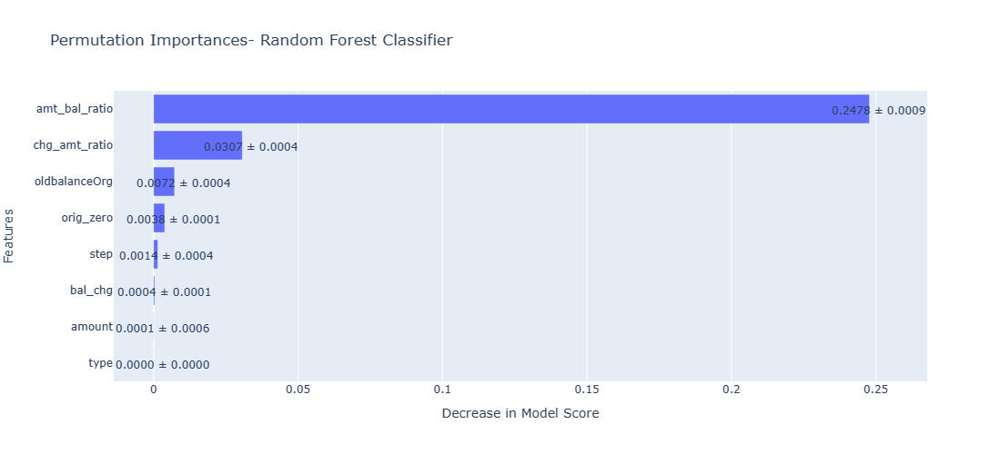


1.1.2 SHAP EXPLAINATION



100%|===================| 79931/80000 [19:08<00:00]        

SHAP Summary Plot for Random Forest Classifier


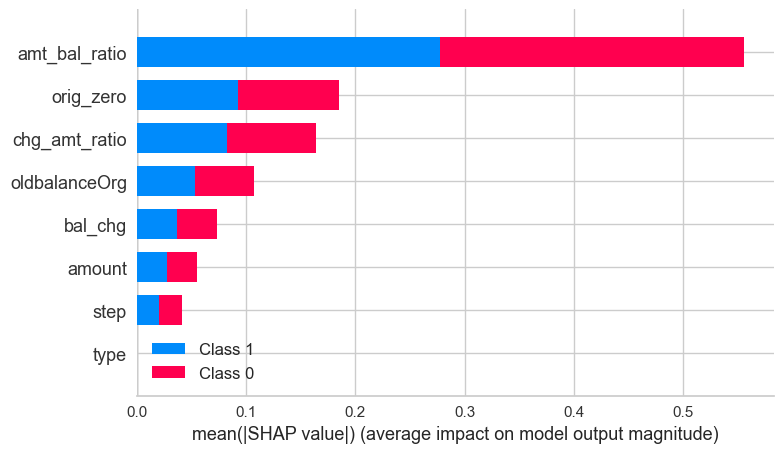


1.1.3 PARTIAL DEPENDENCY PLOT



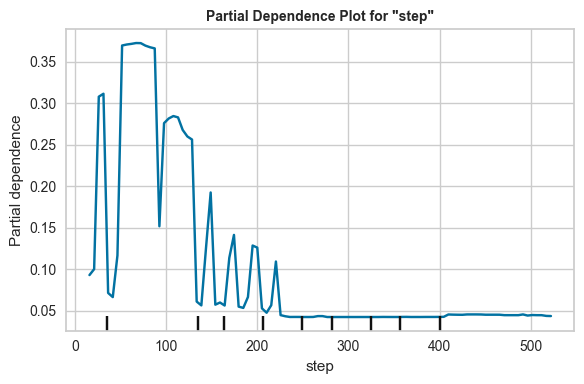

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\sklearn\inspection\_plot\partial_dependence.py:972: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.



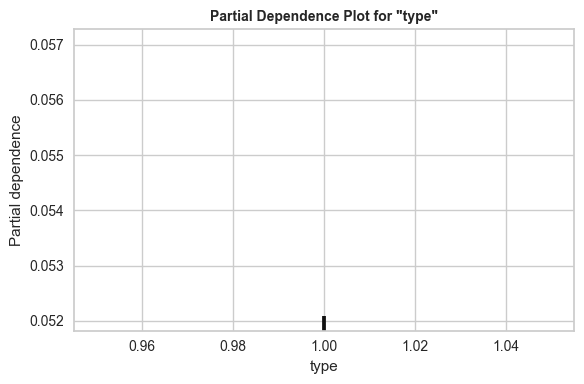

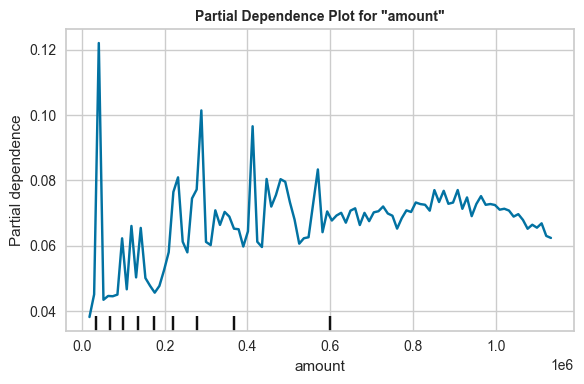

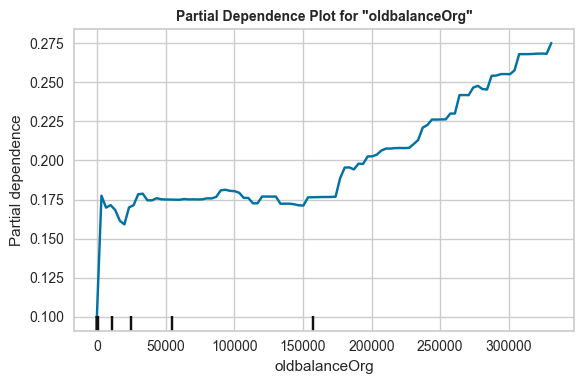

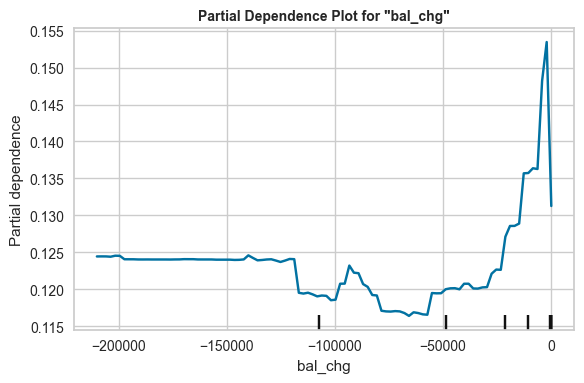

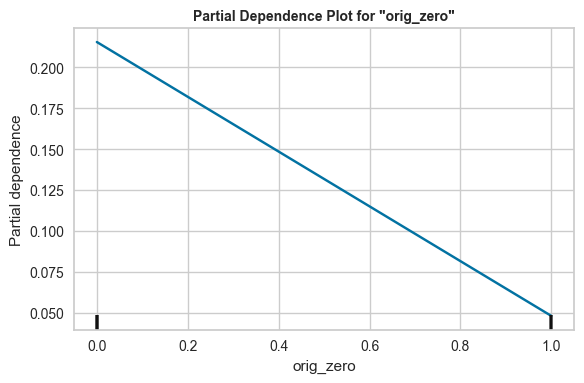

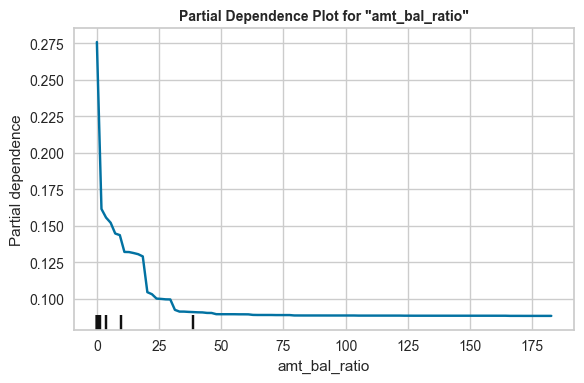

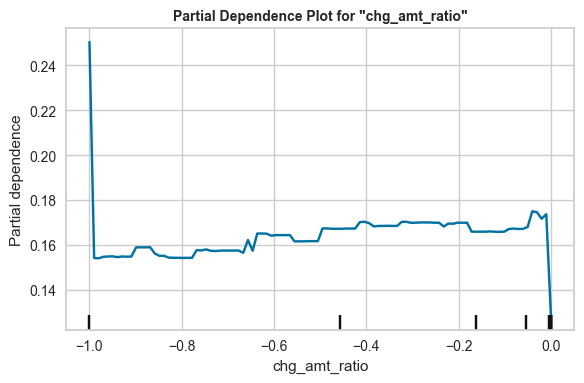

In [6]:
model_name = 'Random Forest Classifier'
X_test = X_test
y_test = y_test
pipeline = rfc_pipeline_a
X_train = X_train_resampled_ad

print(f'\n1.1.2 PERFUMATATION IMPORTANCE PLOT\n')
permutation_importance_plot(pipeline , X_test, y_test, model_name)
print(f'\n1.1.3 SHAP EXPLAINATION\n')
shap_globalExplainer(pipeline, X_train, X_test, model_name)
print(f'\n1.1.4 PARTIAL DEPENDENCY PLOT\n')
partial_dependence_plot(pipeline, X_test)

1.2 GRADIENT BOOST CLASSIFIER

In [7]:
print(f'\n1.2.1  GRADIENT BOOST CLASSIFIER PERMUTATION IMPORTANCE')
perm = PermutationImportance(gbc_pipeline_s, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())


1.2.1  GRADIENT BOOST CLASSIFIER PERMUTATION IMPORTANCE


Weight,Feature
0.0893 ± 0.0016,chg_amt_ratio
0.0647 ± 0.0018,amt_bal_ratio
0.0141 ± 0.0004,oldbalanceOrg
0.0005 ± 0.0000,bal_chg
0.0000 ± 0.0000,amount
0 ± 0.0000,orig_zero
0 ± 0.0000,type
0 ± 0.0000,step



1.2.2 PERFUMATATION IMPORTANCE PLOT



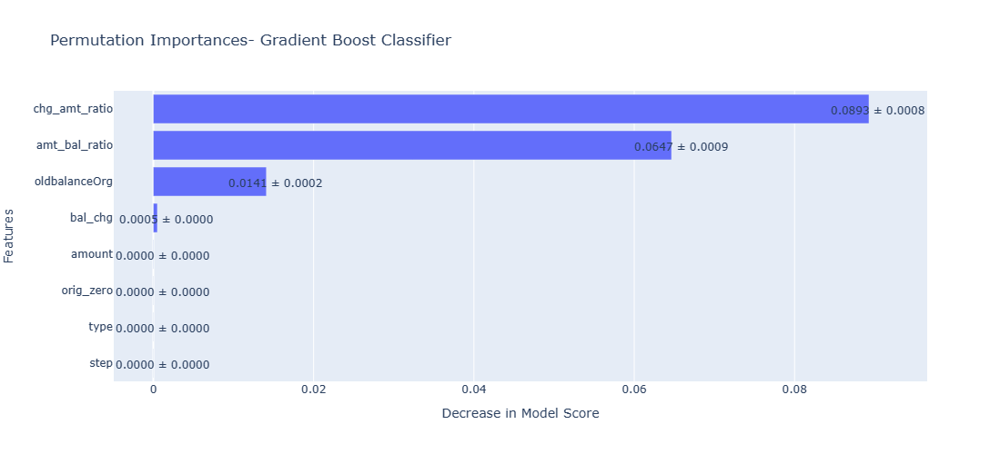


1.1.3 SHAP EXPLAINATION



 98%|===================| 39388/40000 [00:45<00:00]        

SHAP Summary Plot for Gradient Boost Classifier


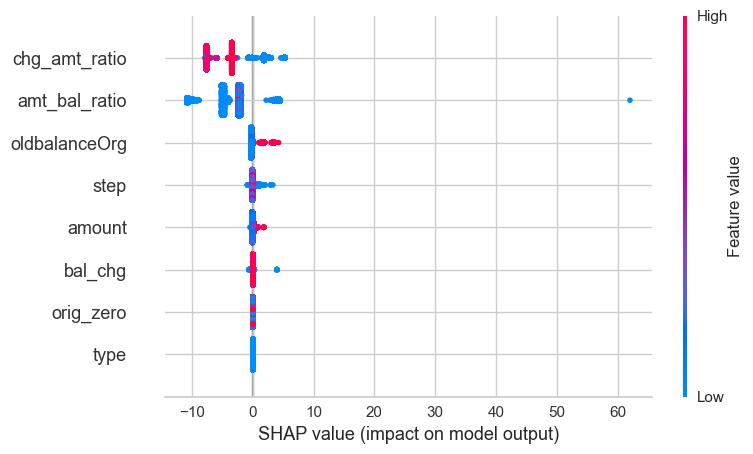


1.1.4 PARTIAL DEPENDENCY PLOT



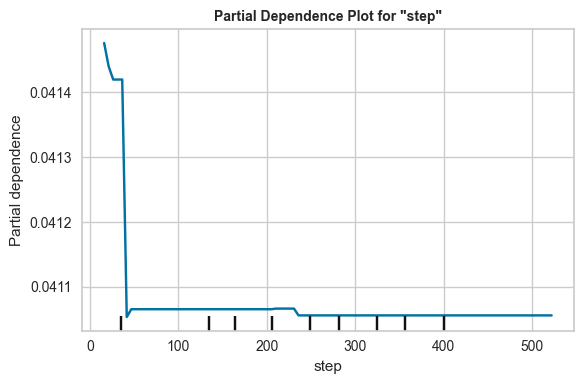

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\sklearn\inspection\_plot\partial_dependence.py:972: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.



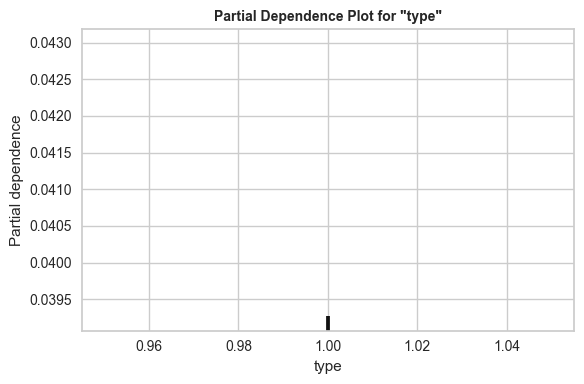

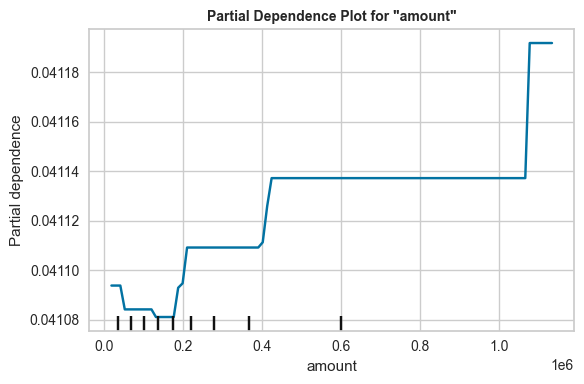

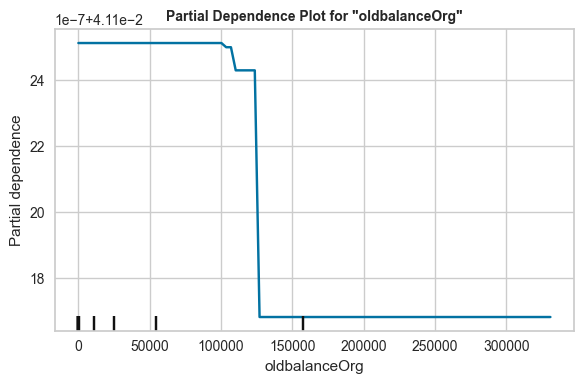

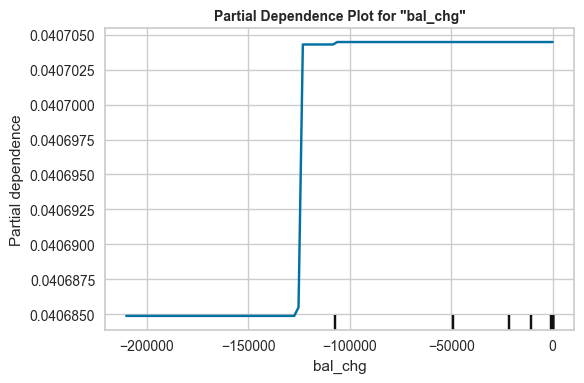

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\sklearn\inspection\_plot\partial_dependence.py:972: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.



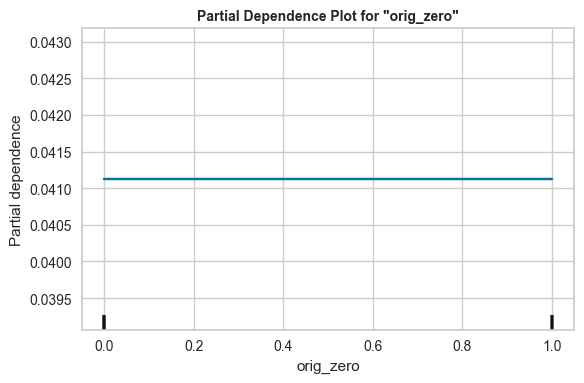

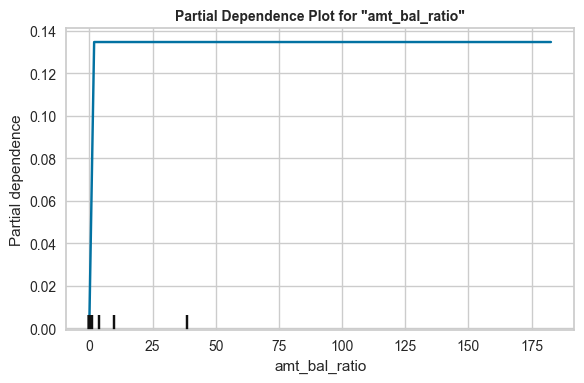

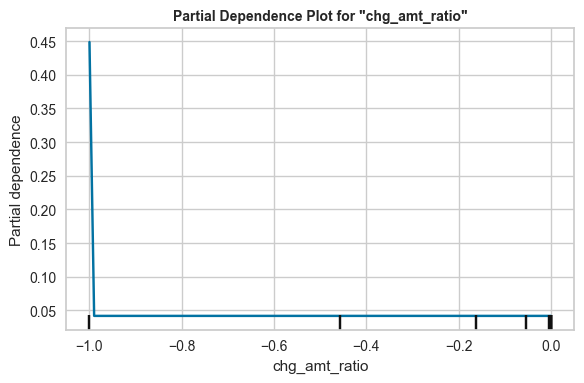

In [9]:
model_name = 'Gradient Boost Classifier'
X_test = X_test
y_test = y_test
pipeline = gbc_pipeline_s
X_train = X_train_resampled_smote

print(f'\n1.2.2 PERFUMATATION IMPORTANCE PLOT\n')
permutation_importance_plot(pipeline , X_test, y_test, model_name)
print(f'\n1.1.3 SHAP EXPLAINATION\n')
shap_globalExplainer(pipeline, X_train, X_test, model_name)
print(f'\n1.1.4 PARTIAL DEPENDENCY PLOT\n')
partial_dependence_plot(pipeline, X_test)

1.3 MLP CLASSIFIER

In [10]:
print(f'\n1.3.1 MLP CLASSIFIER PERMUTATION IMPORTANCE')
perm = PermutationImportance(mlp_pipeline_stm, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())


1.3.1 MLP CLASSIFIER PERMUTATION IMPORTANCE


Weight,Feature
0.2533 ± 0.0026,chg_amt_ratio
0.1145 ± 0.0012,orig_zero
0.1033 ± 0.0024,oldbalanceOrg
0.0665 ± 0.0016,bal_chg
0.0403 ± 0.0007,amount
0.0016 ± 0.0002,amt_bal_ratio
0 ± 0.0000,type
-0.0001 ± 0.0003,step



1.3.2 PERFUMATATION IMPORTANCE PLOT



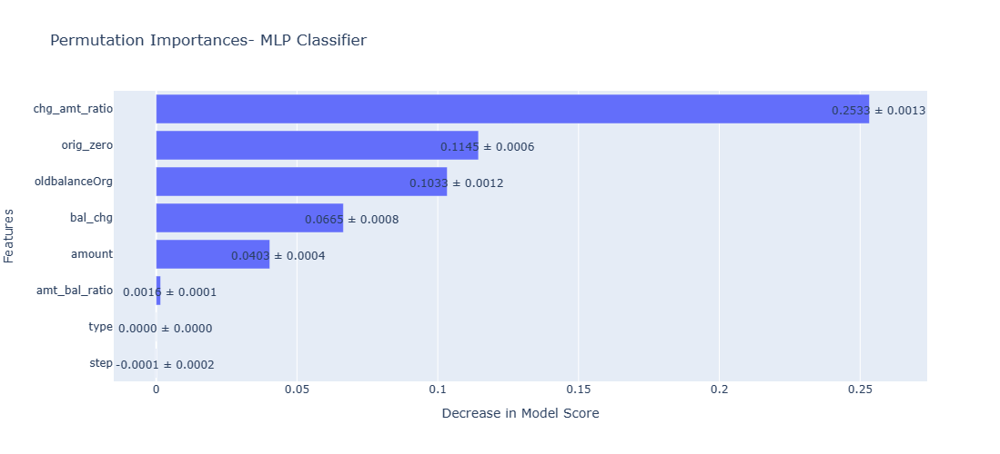


1.3.3 SHAP EXPLAINATION



  0%|          | 0/50 [00:00<?, ?it/s]

SHAP Summary Plot for MLP Classifier


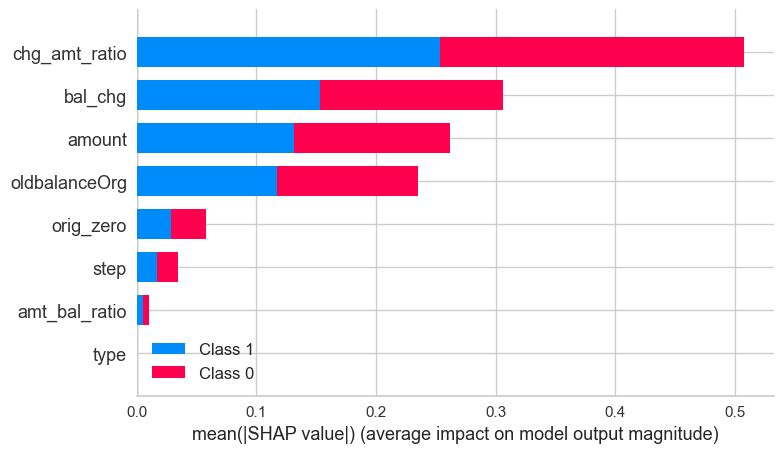


1.3.4 PARTIAL DEPENDENCY PLOT



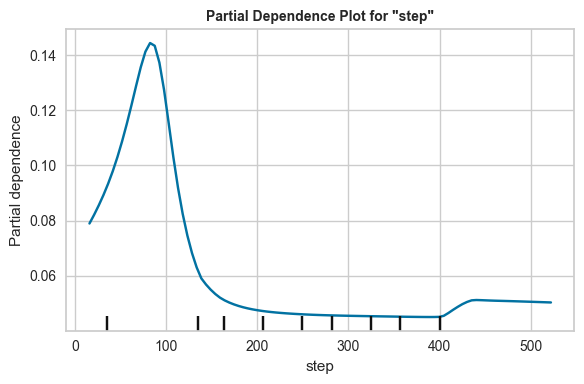

C:\Users\Administrator\AppData\Roaming\Python\Python311\site-packages\sklearn\inspection\_plot\partial_dependence.py:972: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.



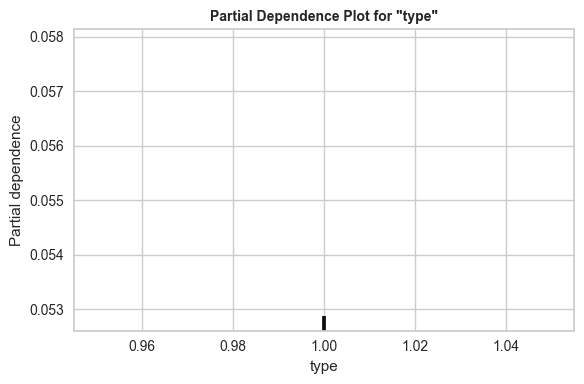

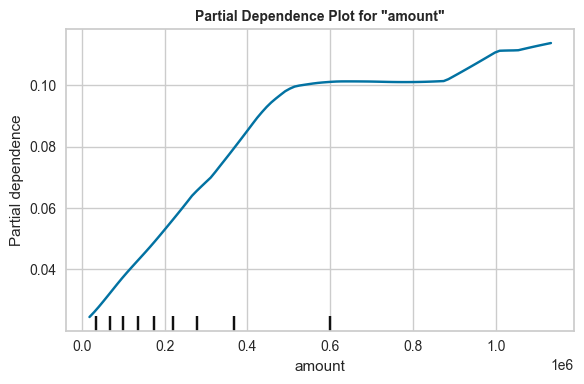

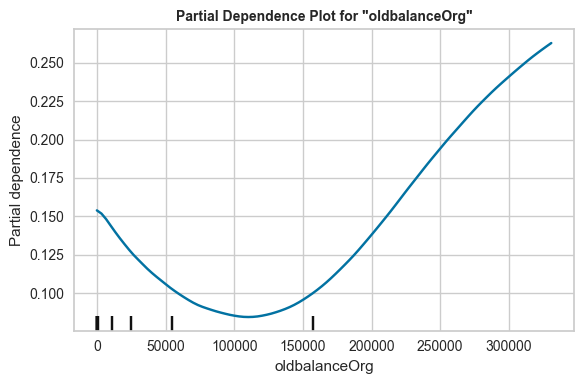

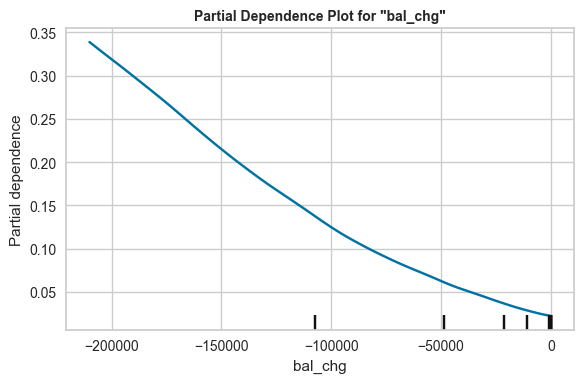

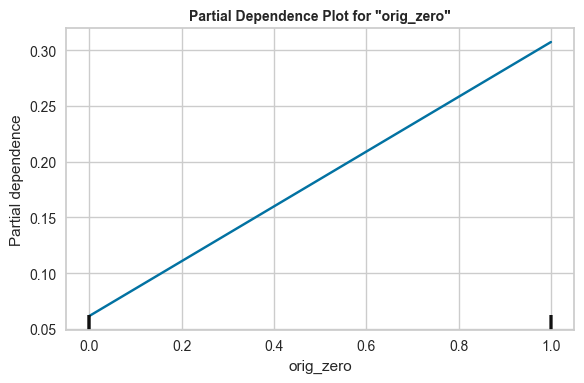

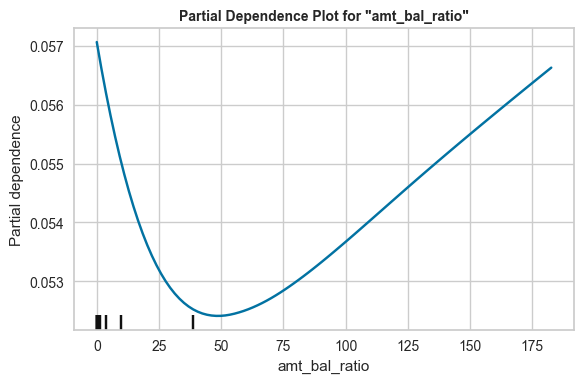

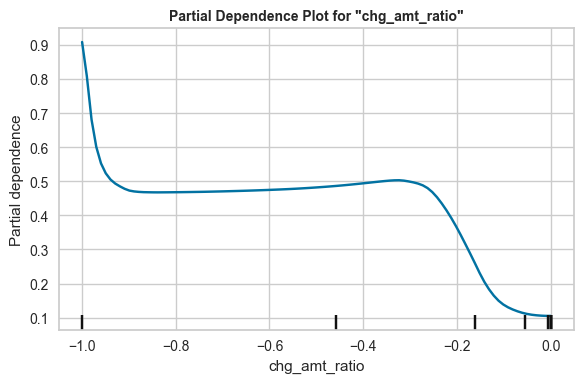

In [13]:
model_name = 'MLP Classifier'
X_test = X_test
y_test = y_test
pipeline = mlp_pipeline_stm
X_train = X_train_resampled_stomek

print(f'\n1.3.2 PERFUMATATION IMPORTANCE PLOT\n')
permutation_importance_plot(pipeline , X_test, y_test, model_name)
print(f'\n1.3.3 SHAP EXPLAINATION\n')
shap_globalExplainer(pipeline, X_train, X_test, model_name)
print(f'\n1.3.4 PARTIAL DEPENDENCY PLOT\n')
partial_dependence_plot(pipeline, X_test)

# 2. LOCAL EXPLAINATION- PREDICTION INSTANCES

2.1: RANDOM FOREST CLASSIFIER

2.1.1: Prediction Instance: Fraud


2.1.1.1 LIME (Local Interpretable Model-agnostic Explainations)

Intercept 0.32568527728794394
Prediction_local [0.26384565]
Right: 0.997105540691333
LIME Explanation for Random Forest Classfier for the 96th test instance



2.1.1.1.1 LIME RESULT INTERPRETATION

Intercept 0.3284714894466946
Prediction_local [0.2646976]
Right: 0.997105540691333
Explanation of the Model's Prediction (Class Fraudulent) for instance 96:

The model's prediction decreases likelihood of being classified as Fraudulent because 'chg_amt_ratio' is not more than -1.00.
The model's prediction increases likelihood of being classified as Fraudulent because '0.00<amt_bal_ratio' is not more than 1.00.
The model's prediction increases likelihood of being classified as Fraudulent because 'orig_zero' is not more than 0.00.
The model's prediction increases likelihood of being classified as Fraudulent because 'amount' is more than 232982.39.
The model's prediction decreases likelihood of being classified as Fraudulent because 'oldbalanceOrg' is more than 70684.78.
The model's prediction decreases likelihood of being classified as Fraudulent because '145.00<step' is not more than 260.00.
The model's prediction decreases likelihood of being clas

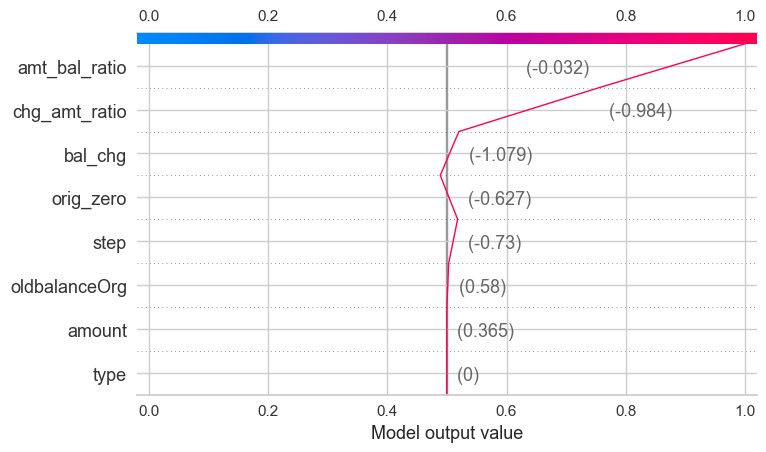

Random Forest Classfier Force Plot


<Figure size 800x550 with 0 Axes>

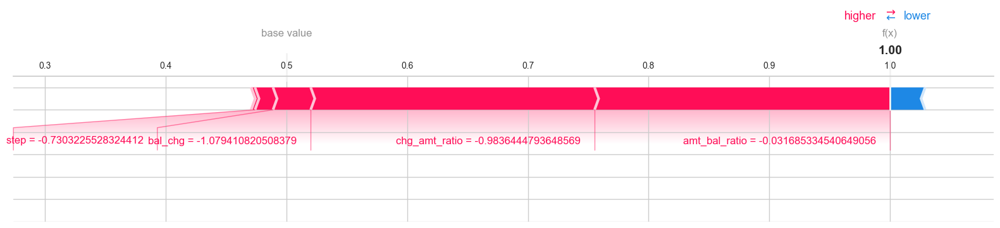

<Figure size 800x550 with 0 Axes>


2.1.1.3 COUNTERFACTUAL EXPLAINATON

Counterfactual Explanation for Random Forest Classfier
Genetic Method


  0%|          | 0/1 [00:00<?, ?it/s]

Initializing initial parameters to the genetic algorithm...
Initialization complete! Generating counterfactuals...


100%|██████████| 1/1 [00:06<00:00,  6.00s/it]

Diverse Counterfactuals found! total time taken: 00 min 05 sec
Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,158.0,-,-,-,-,-,0.9,-,0.0
0,158.0,-,-,-,-,-,0.9,-,0.0


Kdtree Method


100%|██████████| 1/1 [03:05<00:00, 185.38s/it]

Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
60241,256.0,-,-,-,-,-,1.1,-,0.0
65937,331.0,-,-,-,-,-,-,-,0.0


Random Sampling Method


100%|██████████| 1/1 [00:01<00:00,  1.63s/it]

Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,-,-,-,-,-,-,217867.8,-,0.0
1,-,-,-,-,-,-,458272.0,-,0.0


In [5]:
pipeline = rfc_pipeline_a
X_train = X_train_resampled_ad
y_train = y_train_resampled_ad
X_test = X_test
index = 96
model_name = 'Random Forest Classfier'
instance_index = 96
baseline = 0
pred_class = 0


print('\n2.1.1.1 LIME (Local Interpretable Model-agnostic Explainations)\n')
lime_Explainer(pipeline, X_train, X_test, index, model_name)
print('\n2.1.1.1.1 LIME RESULT INTERPRETATION\n')
interpret_lime_results(pipeline, X_train, X_test, index, num_features=8)
print('\n2.1.1.2 SHAP(SHapley Additive exPlanations)\n')
instance_plot(pipeline, X_train, X_test, model_name, pred_class, baseline,  instance_index)
print('\n2.1.1.3 COUNTERFACTUAL EXPLAINATON\n')
counterfactual_Mlexplainer(pipeline, X_train, X_test, y_train, instance_index, model_name)

2.1.2: Prediction Instance: Non Fraud



2.1.2.1. LIME (Local Interpretable Model-agnostic Explainations)

Intercept 0.20822787630568546
Prediction_local [0.40754114]
Right: 0.0
LIME Explanation for Random Forest Classfier for the 19th test instance



2.1.2.1.1 LIME RESULT INTERPRETATION

Intercept 0.20441565958271535
Prediction_local [0.40234222]
Right: 0.0
Explanation of the Model's Prediction (Class Legitimate) for instance 19:

The model's prediction increases likelihood of being classified as Legitimate because '-0.73<chg_amt_ratio' is not more than 0.00.
The model's prediction decreases likelihood of being classified as Legitimate because '0.00<orig_zero' is not more than 1.00.
The model's prediction increases likelihood of being classified as Legitimate because '-17574.12<bal_chg' is not more than 0.00.
The model's prediction increases likelihood of being classified as Legitimate because 'amt_bal_ratio' is not more than 0.00.
The model's prediction increases likelihood of being classified as Legitimate because 'oldbalanceOrg' is not more than 0.00.
The model's prediction decreases likelihood of being classified as Legitimate because '145.00<step' is not more than 260.00.
The model's prediction decreases likelihood of being c

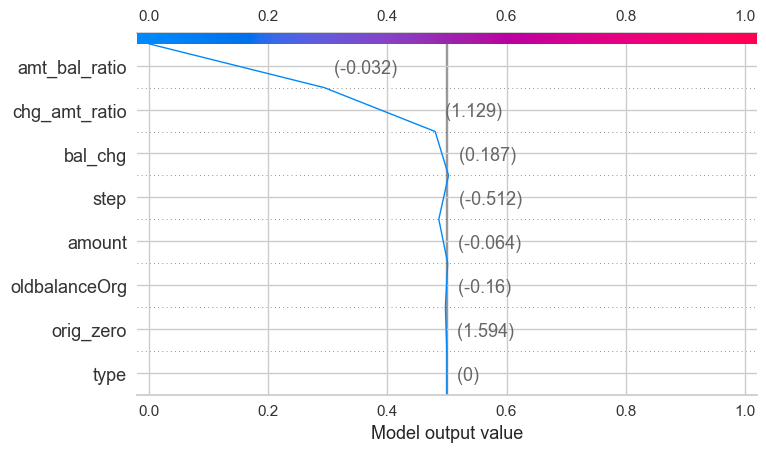

Random Forest Classfier Force Plot


<Figure size 800x550 with 0 Axes>

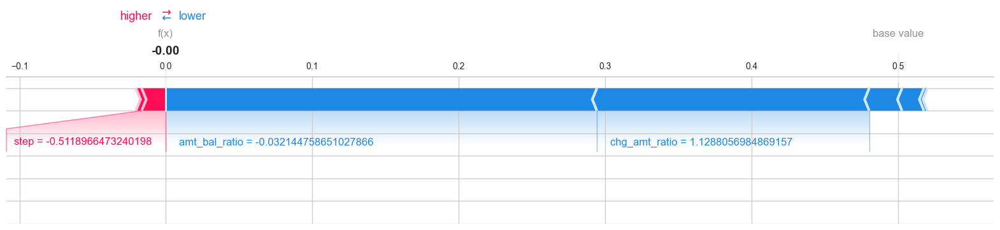

<Figure size 800x550 with 0 Axes>


2.1.2.3 COUNTERFACTUAL EXPLAINATON

Counterfactual Explanation for Random Forest Classfier
Genetic Method


  0%|          | 0/1 [00:00<?, ?it/s]

Initializing initial parameters to the genetic algorithm...
Initialization complete! Generating counterfactuals...


100%|██████████| 1/1 [00:05<00:00,  5.48s/it]

Diverse Counterfactuals found! total time taken: 00 min 05 sec
Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,45.0,-,-,-,-,-,-,-,1.0
0,45.0,-,-,-,-,-,-,-,1.0


Kdtree Method


100%|██████████| 1/1 [00:23<00:00, 23.39s/it]

Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
208262,44.0,-,-,-,-,-,-,-,1.0
193737,44.0,-,-,-,-,-,-,-,1.0


Random Sampling Method


100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,-,-,-,56424126.3,-,-,-,-,1.0
1,-,-,-,3816562.9,-,0.0,-,-,1.0


In [6]:
pipeline = rfc_pipeline_a
X_train = X_train_resampled_ad
y_train = y_train_resampled_ad
X_test = X_test
index = 19
model_name = 'Random Forest Classfier'
instance_index = 19
baseline = 0
pred_class = 1


print('\n2.1.2.1. LIME (Local Interpretable Model-agnostic Explainations)\n')
lime_Explainer(pipeline, X_train, X_test, index, model_name)
print('\n2.1.2.1.1 LIME RESULT INTERPRETATION\n')
interpret_lime_results(pipeline, X_train, X_test, index, num_features=8)
print('\n2.1.2.2 SHAP(SHapley Additive exPlanations)\n')
instance_plot(pipeline, X_train, X_test, model_name, pred_class, baseline,  instance_index)
print('\n2.1.2.3 COUNTERFACTUAL EXPLAINATON\n')
counterfactual_Mlexplainer(pipeline, X_train, X_test, y_train, instance_index, model_name)

2.2: GRADIENT BOOST CLASSIFIER

2.2.1: Prediction Instance: Fraud

In [7]:
pipeline = gbc_pipeline_s
X_train = X_train_resampled_smote
y_train = y_train_resampled_smote
X_test = X_test
index = 96
model_name = 'Gradient Boost Classifier'
instance_index = 96
baseline = 0
pred_class = 0


print('\n2.2.1.1 LIME (Local Interpretable Model-agnostic Explainations)\n')
lime_Explainer(pipeline, X_train, X_test, index, model_name)
print('\n2.2.1.1.1 LIME RESULT INTERPRETATION\n')
interpret_lime_results(pipeline, X_train, X_test, index, num_features=8)
print('\n2.2.1.3 COUNTERFACTUAL EXPLAINATON\n')
counterfactual_Mlexplainer(pipeline, X_train, X_test, y_train, instance_index, model_name)


2.2.1.1 LIME (Local Interpretable Model-agnostic Explainations)

Intercept 0.19308488316299866
Prediction_local [0.34288442]
Right: 0.9998596030504703
LIME Explanation for Gradient Boost Classifier for the 96th test instance



2.2.1.1.1 LIME RESULT INTERPRETATION

Intercept 0.18282046787209763
Prediction_local [0.34791805]
Right: 0.9998596030504703
Explanation of the Model's Prediction (Class Fraudulent) for instance 96:

The model's prediction increases likelihood of being classified as Fraudulent because 'oldbalanceOrg' is more than 51233.06.
The model's prediction decreases likelihood of being classified as Fraudulent because '0.21<amt_bal_ratio' is not more than 1.00.
The model's prediction increases likelihood of being classified as Fraudulent because 'chg_amt_ratio' is not more than -1.00.
The model's prediction increases likelihood of being classified as Fraudulent because 'amount' is more than 205538.95.
The model's prediction increases likelihood of being classified as Fraudulent because 'step' is not more than 177.00.
The model's prediction increases likelihood of being classified as Fraudulent because 'bal_chg' is not more than -41015.52.
The model's prediction increases likelihood of being class

  0%|          | 0/1 [00:00<?, ?it/s]

Initializing initial parameters to the genetic algorithm...
Initialization complete! Generating counterfactuals...


100%|██████████| 1/1 [00:02<00:00,  2.79s/it]

Diverse Counterfactuals found! total time taken: 00 min 02 sec
Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,158.0,-,-,-,-,-,0.9,-,0.0
0,134.0,-,-,-,-,-,-,-,0.0


Kdtree Method


100%|██████████| 1/1 [00:30<00:00, 30.49s/it]

Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
60241,256.0,-,-,-,-,-,-,-,0.0
65937,331.0,-,-,-,-,-,0.9,-,0.0


Random Sampling Method


100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,-,-,-,-,-,-,205015.8,-0.2,0.0
1,-,-,-,-,-,-,10668.4,-0.6,0.0



2.2.1.2 SHAP(SHapley Additive exPlanations)

GBC Classifier Decision Plot


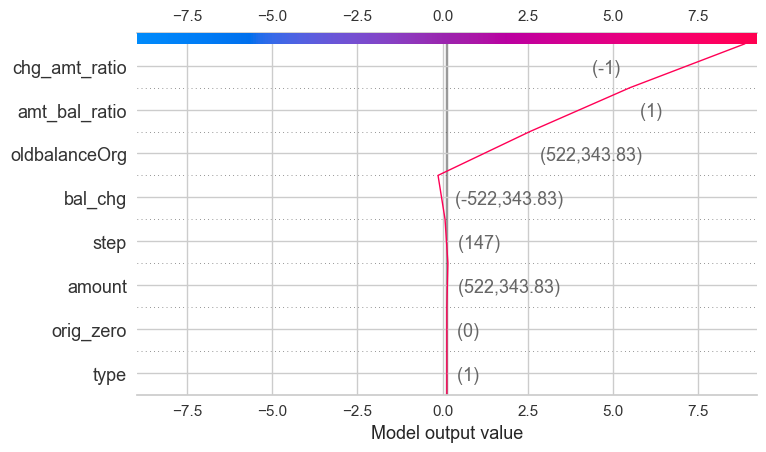

GBC Classifier Force Plot


In [8]:
pipeline = gbc_pipeline_s
X_train = X_train_resampled_smote
X_test = X_test
model_name = 'GBC Classifier'
pred_class = 1
instance_index = 96

print('\n2.2.1.2 SHAP(SHapley Additive exPlanations)\n')
instance_plot_(pipeline, X_train, X_test, model_name, pred_class, instance_index)

In [ ]:
2.2.2: Prediction Instance: Non-Fraud

In [9]:
pipeline = gbc_pipeline_s
X_train = X_train_resampled_smote
y_train = y_train_resampled_smote
X_test = X_test
index = 19
model_name = 'Gradient Boost Classfier'
instance_index = 19
baseline = 0
pred_class = 1


print('\n2.2.2.1 LIME (Local Interpretable Model-agnostic Explainations)\n')
lime_Explainer(pipeline, X_train, X_test, index, model_name)
print('\n2.2.2.1.1 LIME RESULT INTERPRETATION\n')
interpret_lime_results(pipeline, X_train, X_test, index, num_features=8)
print('\n2.2.2.3 COUNTERFACTUAL EXPLAINATON\n')
counterfactual_Mlexplainer(pipeline, X_train, X_test, y_train, instance_index, model_name)


2.2.2.1 LIME (Local Interpretable Model-agnostic Explainations)

Intercept 0.2896355062343381
Prediction_local [-0.04797354]
Right: 0.00017858675210985424
LIME Explanation for Gradient Boost Classfier for the 19th test instance



2.2.2.1.1 LIME RESULT INTERPRETATION

Intercept 0.2618572360518057
Prediction_local [-0.00450428]
Right: 0.00017858675210985424
Explanation of the Model's Prediction (Class Legitimate) for instance 19:

The model's prediction decreases likelihood of being classified as Legitimate because 'amt_bal_ratio' is not more than 0.21.
The model's prediction decreases likelihood of being classified as Legitimate because 'oldbalanceOrg' is not more than 93.99.
The model's prediction decreases likelihood of being classified as Legitimate because '-1.00<chg_amt_ratio' is not more than 0.00.
The model's prediction increases likelihood of being classified as Legitimate because '177.00<step' is not more than 304.00.
The model's prediction decreases likelihood of being classified as Legitimate because '-11341.32<bal_chg' is not more than 0.00.
The model's prediction increases likelihood of being classified as Legitimate because 'orig_zero' is more than 0.00.
The model's prediction increases likelihood

  0%|          | 0/1 [00:00<?, ?it/s]

Initializing initial parameters to the genetic algorithm...
Initialization complete! Generating counterfactuals...


100%|██████████| 1/1 [00:03<00:00,  3.33s/it]

Diverse Counterfactuals found! total time taken: 00 min 03 sec
Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,1.0,-,-,-,-10000000.0,-,-,-1.0,1.0
0,1.0,-,-,-,-10000000.0,-,1.6,-0.6,1.0


Kdtree Method


100%|██████████| 1/1 [00:03<00:00,  3.83s/it]

Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
99243,13.0,-,-,79466.5,-79466.5,0.0,1.6,-0.6,1.0
53607,12.0,-,-,49938.0,-49938.0,0.0,1.6,-0.6,1.0


Random Sampling Method


100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,-,-,-,34017912.4,-,-,-,-,1.0
1,-,-,-,22262239.1,-,-,-,-,1.0



2.2.1.2 SHAP(SHapley Additive exPlanations)

GBC Classifier Decision Plot


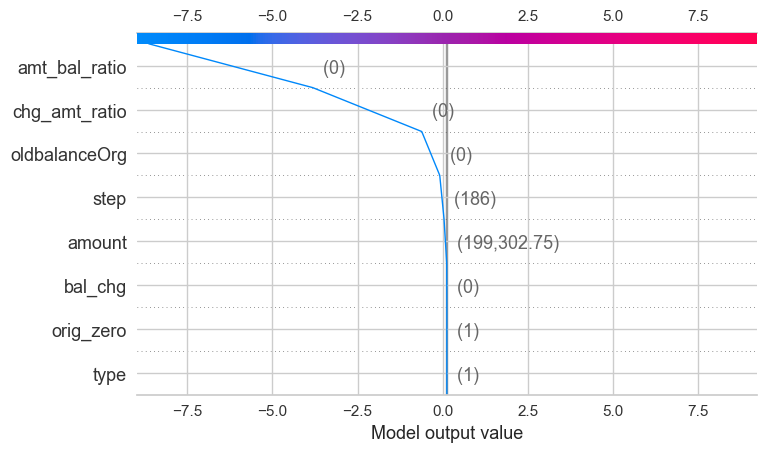

GBC Classifier Force Plot


In [10]:
pipeline = gbc_pipeline_s
X_train = X_train_resampled_smote
X_test = X_test
model_name = 'GBC Classifier'
pred_class = 0
instance_index = 19

print('\n2.2.1.2 SHAP(SHapley Additive exPlanations)\n')
instance_plot_(pipeline, X_train, X_test, model_name, pred_class, instance_index)

2.3: MPL ClASSIFIER

2.3.1: Prediction Instance: Fraud


2.3.1.1 LIME (Local Interpretable Model-agnostic Explainations)

Intercept 0.43131628905271857
Prediction_local [0.81450259]
Right: 0.9987786592973124
LIME Explanation for MLP Classifier for the 96th test instance



2.3.1.1.1 LIME RESULT INTERPRETATION

Intercept 0.4315195061894334
Prediction_local [0.80654251]
Right: 0.9987786592973124
Explanation of the Model's Prediction (Class Fraudulent) for instance 96:

The model's prediction increases likelihood of being classified as Fraudulent because 'bal_chg' is not more than -448037.20.
The model's prediction increases likelihood of being classified as Fraudulent because 'chg_amt_ratio' is not more than -1.00.
The model's prediction decreases likelihood of being classified as Fraudulent because 'oldbalanceOrg' is more than 474467.20.
The model's prediction decreases likelihood of being classified as Fraudulent because 'orig_zero' is not more than 0.00.
The model's prediction increases likelihood of being classified as Fraudulent because '0.20<amt_bal_ratio' is not more than 1.00.
The model's prediction decreases likelihood of being classified as Fraudulent because '233779.79<amount' is not more than 644781.76.
The model's prediction increases likelih

  0%|          | 0/100 [00:00<?, ?it/s]

MLP Classifier Decision Plot


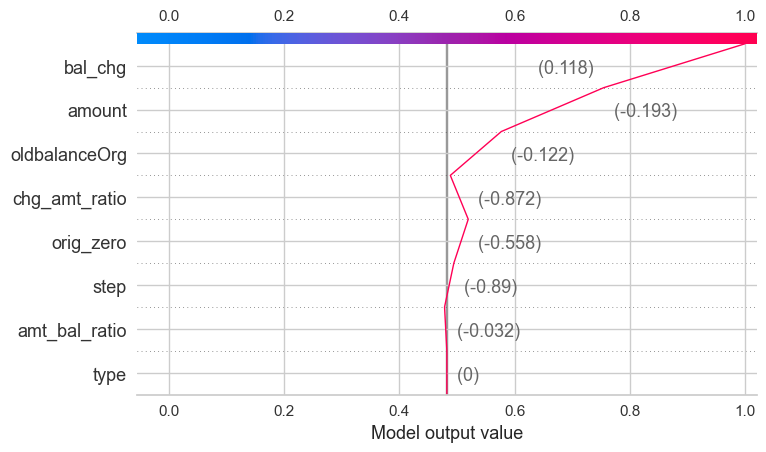

MLP Classifier Force Plot


<Figure size 800x550 with 0 Axes>

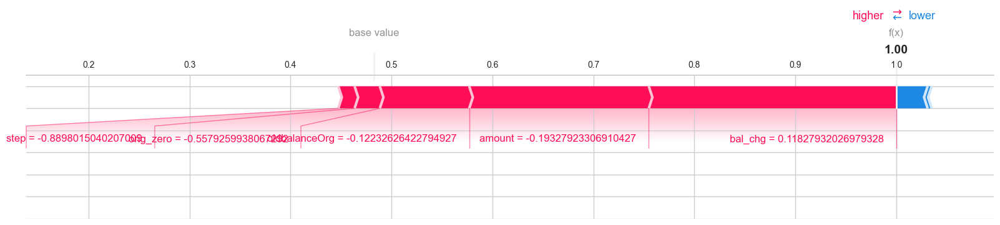

<Figure size 800x550 with 0 Axes>


2.3.1.3 COUNTERFACTUAL EXPLAINATON

Counterfactual Explanation for MLP Classifier
Genetic Method


  0%|          | 0/1 [00:00<?, ?it/s]

Initializing initial parameters to the genetic algorithm...
Initialization complete! Generating counterfactuals...


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]

Diverse Counterfactuals found! total time taken: 00 min 02 sec
Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,158.0,-,-,-,-,-,0.9,-,0.0
0,158.0,-,-,-,-,-,0.9,-,0.0


Kdtree Method


100%|██████████| 1/1 [02:40<00:00, 160.84s/it]

Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
65816,331.0,-,-,-,-,-,-,-,0.0
53485,-,-,-,-,-,-,-,-,0.0


Random Sampling Method


100%|██████████| 1/1 [00:01<00:00,  1.68s/it]

Query instance (original outcome : 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,147,1,522343.84375,522343.84375,-522343.84375,0,1.0,-1.0,1



Diverse Counterfactual set (new outcome: 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,-,-,-,-,-,-,-,-,0.0
1,-,-,-,-,-,-,-,-0.7,0.0


In [11]:
pipeline = mlp_pipeline_stm
X_train = X_train_resampled_stomek
y_train = y_train_resampled_stomek
X_test = X_test
index = 96
model_name = 'MLP Classifier'
instance_index = 96
baseline = 0
pred_class = 0


print('\n2.3.1.1 LIME (Local Interpretable Model-agnostic Explainations)\n')
lime_Explainer(pipeline, X_train, X_test, index, model_name)
print('\n2.3.1.1.1 LIME RESULT INTERPRETATION\n')
interpret_lime_results(pipeline, X_train, X_test, index, num_features=8)
print('\n2.3.1.2 SHAP(SHapley Additive exPlanations)\n')
instance_plot(pipeline, X_train, X_test, model_name, baseline, pred_class, instance_index)
print('\n2.3.1.3 COUNTERFACTUAL EXPLAINATON\n')
counterfactual_Mlexplainer(pipeline, X_train, X_test, y_train, instance_index, model_name)

2.3.2: Prediction Instance: Non-Fraud


2.3.2.1 LIME (Local Interpretable Model-agnostic Explainations)

Intercept 0.6021269172436458
Prediction_local [0.45673983]
Right: 0.006651572704561144
LIME Explanation for MLP Classifier for the 19th test instance



2.3.2.1.1 LIME RESULT INTERPRETATION

Intercept 0.6017828910669002
Prediction_local [0.41338565]
Right: 0.006651572704561144
Explanation of the Model's Prediction (Class Legitimate) for instance 19:

The model's prediction decreases likelihood of being classified as Legitimate because 'chg_amt_ratio' is more than -0.00.
The model's prediction decreases likelihood of being classified as Legitimate because 'bal_chg' is more than -212.36.
The model's prediction increases likelihood of being classified as Legitimate because 'oldbalanceOrg' is not more than 236.00.
The model's prediction increases likelihood of being classified as Legitimate because 'orig_zero' is more than 0.00.
The model's prediction decreases likelihood of being classified as Legitimate because '98293.88<amount' is not more than 233779.79.
The model's prediction decreases likelihood of being classified as Legitimate because '178.00<step' is not more than 294.00.
The model's prediction increases likelihood of being class

  0%|          | 0/100 [00:00<?, ?it/s]

MLP Classifier Decision Plot


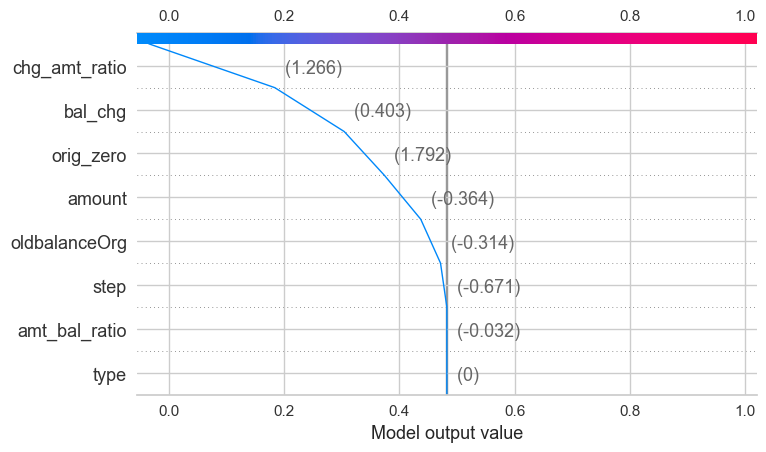

MLP Classifier Force Plot


<Figure size 800x550 with 0 Axes>

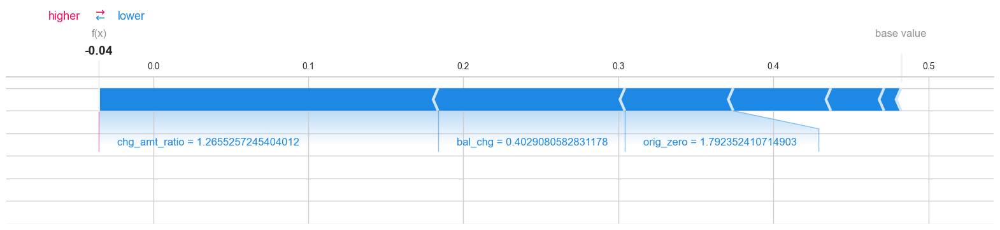

<Figure size 800x550 with 0 Axes>


2.3.2.3 COUNTERFACTUAL EXPLAINATON

Counterfactual Explanation for MLP Classifier
Genetic Method


  0%|          | 0/1 [00:00<?, ?it/s]

Initializing initial parameters to the genetic algorithm...
Initialization complete! Generating counterfactuals...


100%|██████████| 1/1 [00:03<00:00,  3.75s/it]

Diverse Counterfactuals found! total time taken: 00 min 03 sec
Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,1.0,-,-,-,-10000000.0,0.0,-,-,1.0
0,1.0,-,-,66446.4,-,0.0,-,-,1.0


Kdtree Method


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]

Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
95509,1.0,-,-,149736.0,-,0.0,1.0,-,1.0
16276,254.0,-,-,65766.0,-65766.0,0.0,1.0,-1.0,1.0


Random Sampling Method


100%|██████████| 1/1 [00:01<00:00,  1.77s/it]

Query instance (original outcome : 0)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,186,1,199302.75,0.0,0.0,1,0.0,0.0,0



Diverse Counterfactual set (new outcome: 1)


,step,type,amount,oldbalanceOrg,bal_chg,orig_zero,amt_bal_ratio,chg_amt_ratio,isFraud
0,-,-,-,-,-9365962.0,-,-,0.1,1.0
1,-,-,-,-,-667641.6,-,-,-,1.0


In [12]:
pipeline = mlp_pipeline_stm
X_train = X_train_resampled_stomek
y_train = y_train_resampled_stomek
X_test = X_test
index = 19
model_name = 'MLP Classifier'
instance_index = 19
baseline = 0
pred_class = 1


print('\n2.3.2.1 LIME (Local Interpretable Model-agnostic Explainations)\n')
lime_Explainer(pipeline, X_train, X_test, index, model_name)
print('\n2.3.2.1.1 LIME RESULT INTERPRETATION\n')
interpret_lime_results(pipeline, X_train, X_test, index, num_features=8)
print('\n2.3.2.2 SHAP(SHapley Additive exPlanations)\n')
instance_plot(pipeline, X_train, X_test, model_name, pred_class, baseline,  instance_index)
print('\n2.3.2.3 COUNTERFACTUAL EXPLAINATON\n')
counterfactual_Mlexplainer(pipeline, X_train, X_test, y_train, instance_index, model_name)

In [ ]:
model_name = ''
X_test = ''
y_test = ''
pipeline = ''
X_train = ''

print(f'\n1.2.1  {model_name} PERMUTATION IMPORTANCE SCORE')
perm = PermutationImportance(pipeline, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

print(f'\n1.2.2 PERFUMATATION IMPORTANCE PLOT\n')
permutation_importance_plot(pipeline , X_test, y_test, model_name)

print(f'\n1.1.3 SHAP EXPLAINATION\n')
shap_globalExplainer(pipeline, X_train, X_test, model_name)

print(f'\n1.1.4 PARTIAL DEPENDENCY PLOT\n')
partial_dependence_plot(pipeline, X_test)

In [ ]:
pipeline = ''
X_train = ''
y_train = ''
X_test = ''
index = 
model_name = ''
instance_index = ''
baseline = ''
pred_class = ''


print('\n2.3.1.1 LIME (Local Interpretable Model-agnostic Explainations)\n')
lime_Explainer(pipeline, X_train, X_test, index, model_name)
print('\n2.3.1.1.1 LIME RESULT INTERPRETATION\n')
interpret_lime_results(pipeline, X_train, X_test, index, num_features=8)
print('\n2.3.1.2 SHAP(SHapley Additive exPlanations)\n')
instance_plot(pipeline, X_train, X_test, model_name, baseline, pred_class, instance_index)
print('\n2.3.1.3 COUNTERFACTUAL EXPLAINATON\n')
counterfactual_Mlexplainer(pipeline, X_train, X_test, y_train, instance_index, model_name)